In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn import tree
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, roc_auc_score,roc_curve
from pandas_profiling import ProfileReport

In [2]:
wine_quality_df = pd.read_csv('winequality-red.csv')
wine_quality_df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [3]:
#Profile report using pandas profiling
ProfileReport(wine_quality_df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [5]:
X = wine_quality_df.drop(columns = 'quality')

In [6]:
y = wine_quality_df['quality']

In [7]:
X_train,x_test,Y_train,y_test = train_test_split(X,y,test_size = .20,random_state=300)

In [10]:
dt_model = DecisionTreeClassifier()

In [11]:
dt_model.fit(X_train,Y_train)

DecisionTreeClassifier()

In [14]:
dt_model.predict(x_test)

array([6, 5, 5, 5, 5, 5, 5, 5, 5, 6, 4, 6, 6, 6, 5, 6, 6, 6, 4, 5, 6, 7,
       6, 5, 7, 7, 6, 5, 7, 5, 6, 7, 6, 5, 5, 5, 5, 4, 5, 5, 5, 5, 6, 5,
       6, 5, 5, 6, 6, 6, 6, 5, 5, 4, 5, 6, 7, 5, 6, 6, 6, 7, 5, 6, 8, 5,
       7, 6, 4, 6, 5, 6, 6, 7, 6, 5, 8, 5, 6, 5, 5, 4, 6, 6, 7, 7, 5, 5,
       6, 4, 6, 6, 5, 7, 5, 4, 7, 6, 5, 5, 7, 5, 6, 6, 5, 7, 5, 5, 5, 7,
       6, 5, 5, 6, 5, 6, 6, 6, 6, 5, 6, 5, 6, 6, 6, 7, 5, 6, 6, 6, 5, 5,
       5, 5, 8, 6, 6, 7, 5, 5, 6, 5, 6, 5, 6, 6, 5, 5, 6, 5, 6, 7, 7, 5,
       6, 6, 5, 6, 6, 7, 5, 5, 6, 6, 6, 6, 6, 5, 6, 6, 7, 6, 6, 6, 6, 7,
       5, 5, 5, 5, 6, 6, 6, 6, 5, 6, 6, 6, 5, 5, 5, 5, 6, 4, 6, 4, 6, 6,
       6, 5, 5, 6, 6, 5, 5, 7, 5, 6, 5, 5, 5, 6, 7, 5, 5, 7, 5, 7, 5, 7,
       5, 5, 5, 5, 6, 7, 5, 5, 5, 5, 6, 6, 5, 7, 6, 5, 6, 5, 6, 6, 5, 6,
       5, 6, 7, 5, 5, 5, 5, 5, 7, 5, 7, 5, 5, 6, 6, 6, 5, 7, 6, 6, 5, 5,
       6, 7, 6, 5, 6, 4, 5, 6, 5, 6, 7, 5, 5, 6, 5, 7, 7, 6, 5, 6, 7, 5,
       6, 5, 6, 5, 5, 5, 5, 4, 7, 6, 6, 7, 5, 6, 5,

In [15]:
dt_model.score(x_test,y_test)

0.6

In [16]:
dt_model_gini = DecisionTreeClassifier(criterion='entropy')
dt_model_gini.fit(X_train,Y_train)
dt_model_gini.score(x_test,y_test)

0.603125

In [20]:
dot_file = open('dt_model.dot','w')
tree.export_graphviz(dt_model_gini,out_file=dot_file,feature_names=X.columns)

In [21]:
dir

<function dir>

In [22]:
!ls

'ls' is not recognized as an internal or external command,
operable program or batch file.


In [23]:
ls


 Volume in drive C is SSD
 Volume Serial Number is BC9F-D69E

 Directory of C:\Users\Admin\XGboost_algorithm

19-09-2022  17:34    <DIR>          .
19-09-2022  16:17    <DIR>          ..
19-09-2022  01:45    <DIR>          .ipynb_checkpoints
19-09-2022  17:34                 0 dt_model.dot
19-09-2022  17:33        11,059,310 wine_quality_check.ipynb
21-09-2019  19:06           100,951 winequality-red.csv
               3 File(s)     11,160,261 bytes
               3 Dir(s)  445,489,885,184 bytes free


In [24]:
%matplotlib inline

[Text(0.48064052320846906, 0.9791666666666666, 'X[10] <= 10.25\ngini = 0.639\nsamples = 1279\nvalue = [5, 43, 549, 513, 153, 16]'),
 Text(0.23697250174499768, 0.9375, 'X[1] <= 0.548\ngini = 0.507\nsamples = 665\nvalue = [3, 22, 417, 208, 14, 1]'),
 Text(0.1566135411819451, 0.8958333333333334, 'X[6] <= 60.5\ngini = 0.551\nsamples = 297\nvalue = [0, 7, 151, 129, 9, 1]'),
 Text(0.10103536528617962, 0.8541666666666666, 'X[9] <= 0.645\ngini = 0.555\nsamples = 205\nvalue = [0, 5, 82, 109, 8, 1]'),
 Text(0.06712424383434155, 0.8125, 'X[9] <= 0.465\ngini = 0.552\nsamples = 113\nvalue = [0, 4, 59, 47, 3, 0]'),
 Text(0.057235923685435085, 0.7708333333333334, 'X[1] <= 0.41\ngini = 0.153\nsamples = 12\nvalue = [0, 0, 11, 1, 0, 0]'),
 Text(0.05351326198231736, 0.7291666666666666, 'X[3] <= 1.75\ngini = 0.5\nsamples = 2\nvalue = [0, 0, 1, 1, 0, 0]'),
 Text(0.049790600279199626, 0.6875, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 0, 1, 0, 0]'),
 Text(0.057235923685435085, 0.6875, 'gini = 0.0\nsamples = 1

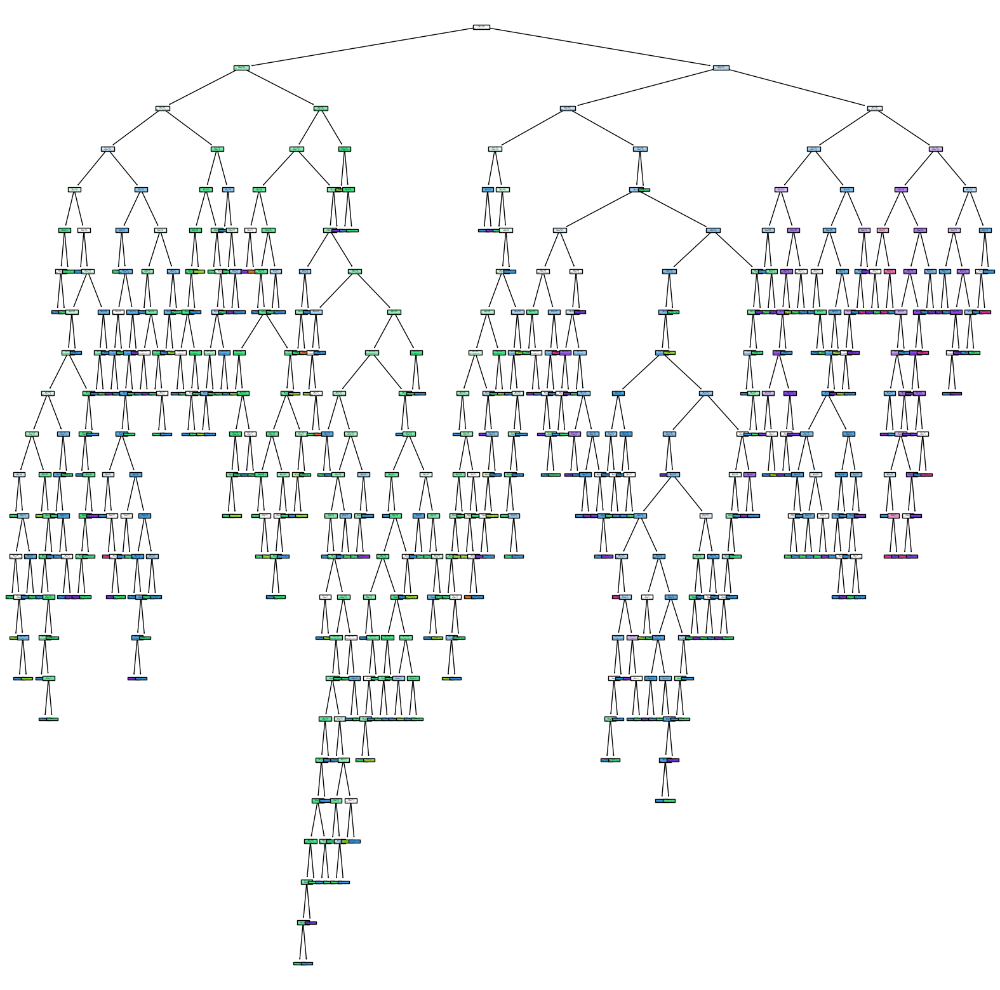

In [26]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model, filled =True)

In [27]:
from sklearn.ensemble import BaggingClassifier


In [28]:
BG_model = BaggingClassifier(DecisionTreeClassifier(),n_estimators=10)
BG_model.fit(X_train,Y_train)

BaggingClassifier(base_estimator=DecisionTreeClassifier())

In [29]:
BG_model.predict(x_test)

array([5, 5, 6, 5, 6, 5, 6, 5, 5, 6, 4, 6, 6, 6, 5, 6, 6, 6, 4, 5, 5, 6,
       5, 6, 6, 6, 6, 5, 7, 5, 5, 7, 6, 5, 6, 6, 5, 6, 5, 5, 5, 5, 6, 5,
       6, 5, 5, 6, 6, 5, 6, 5, 5, 6, 5, 6, 7, 4, 6, 6, 6, 6, 6, 7, 6, 6,
       6, 5, 4, 6, 6, 5, 6, 7, 5, 5, 6, 5, 6, 5, 5, 5, 6, 6, 7, 6, 5, 5,
       6, 4, 5, 5, 5, 7, 5, 5, 7, 6, 5, 6, 7, 5, 6, 6, 6, 7, 5, 5, 5, 7,
       6, 5, 5, 5, 5, 6, 7, 6, 6, 6, 6, 5, 6, 7, 6, 7, 6, 6, 6, 6, 5, 5,
       5, 5, 6, 6, 6, 7, 5, 5, 6, 5, 6, 5, 6, 6, 6, 5, 6, 5, 5, 6, 7, 5,
       6, 6, 6, 5, 5, 6, 5, 5, 6, 6, 5, 6, 6, 5, 6, 6, 7, 6, 6, 6, 6, 6,
       5, 5, 5, 5, 5, 6, 6, 6, 6, 5, 6, 6, 5, 5, 5, 5, 6, 5, 6, 5, 6, 6,
       6, 5, 7, 5, 5, 5, 7, 6, 5, 6, 5, 6, 5, 6, 7, 5, 5, 7, 6, 7, 5, 6,
       5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 6, 5, 7, 6, 5, 6, 5, 6, 6, 6, 5,
       5, 6, 7, 5, 5, 5, 5, 6, 7, 5, 6, 6, 5, 7, 6, 6, 6, 7, 6, 6, 6, 5,
       6, 6, 5, 5, 7, 6, 5, 6, 5, 6, 6, 5, 5, 6, 5, 7, 7, 5, 5, 6, 6, 5,
       6, 5, 6, 5, 5, 5, 6, 6, 7, 7, 5, 6, 5, 6, 5,

In [30]:
from sklearn.neighbors import KNeighborsClassifier
BG_knn = BaggingClassifier(KNeighborsClassifier(6),n_estimators=10)
BG_knn.fit(X_train,Y_train)

BaggingClassifier(base_estimator=KNeighborsClassifier(n_neighbors=6))

In [31]:
BG_knn.predict(x_test)

array([6, 6, 5, 5, 5, 5, 6, 6, 6, 6, 6, 6, 5, 6, 5, 6, 6, 7, 5, 5, 5, 6,
       5, 5, 7, 6, 6, 5, 7, 6, 5, 7, 6, 6, 7, 5, 5, 5, 4, 5, 6, 6, 5, 5,
       5, 5, 5, 5, 6, 6, 6, 6, 4, 6, 6, 7, 7, 7, 7, 5, 5, 7, 6, 6, 7, 6,
       5, 5, 6, 6, 6, 5, 6, 5, 5, 5, 7, 5, 6, 6, 6, 5, 6, 7, 7, 5, 5, 6,
       5, 6, 6, 6, 5, 6, 5, 5, 6, 5, 5, 5, 5, 5, 5, 5, 5, 6, 6, 5, 6, 6,
       6, 6, 5, 5, 5, 6, 7, 6, 6, 5, 5, 6, 5, 6, 5, 7, 5, 5, 5, 5, 5, 5,
       5, 5, 6, 5, 6, 5, 5, 5, 5, 5, 5, 5, 6, 6, 5, 6, 5, 5, 5, 7, 6, 6,
       5, 6, 6, 6, 5, 5, 5, 5, 6, 6, 6, 5, 5, 5, 6, 6, 7, 6, 6, 6, 5, 6,
       6, 5, 5, 5, 6, 5, 5, 5, 5, 5, 6, 5, 5, 6, 5, 5, 6, 6, 6, 5, 6, 6,
       6, 5, 6, 6, 5, 5, 5, 7, 5, 6, 6, 5, 5, 6, 7, 5, 6, 6, 5, 6, 5, 7,
       5, 6, 5, 6, 6, 5, 5, 5, 5, 5, 5, 6, 5, 6, 6, 5, 5, 5, 6, 6, 5, 5,
       6, 5, 7, 6, 5, 6, 5, 6, 6, 5, 5, 6, 5, 7, 6, 6, 6, 7, 6, 5, 6, 6,
       6, 6, 5, 5, 6, 5, 5, 7, 5, 6, 6, 5, 5, 5, 5, 8, 5, 5, 5, 6, 5, 5,
       4, 6, 6, 5, 5, 5, 6, 6, 6, 6, 6, 5, 6, 5, 5,

In [32]:
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier()
rf.fit(X_train,Y_train)


RandomForestClassifier()

In [33]:
rf.predict(x_test)

array([5, 5, 5, 5, 5, 5, 6, 5, 5, 6, 6, 5, 5, 6, 5, 6, 6, 6, 4, 6, 5, 7,
       5, 6, 7, 6, 5, 6, 6, 5, 5, 7, 6, 5, 6, 5, 5, 5, 5, 5, 5, 5, 6, 5,
       6, 5, 5, 6, 6, 6, 6, 6, 5, 5, 5, 6, 7, 5, 6, 6, 6, 6, 6, 7, 6, 6,
       6, 5, 5, 6, 6, 5, 6, 7, 6, 5, 6, 5, 6, 5, 5, 5, 6, 6, 8, 6, 5, 5,
       6, 5, 6, 5, 5, 6, 5, 5, 7, 6, 5, 6, 7, 5, 6, 6, 5, 7, 5, 5, 5, 7,
       5, 5, 5, 5, 5, 6, 6, 5, 6, 5, 6, 5, 6, 6, 6, 7, 6, 5, 6, 6, 5, 5,
       5, 5, 6, 6, 6, 6, 5, 5, 6, 5, 6, 5, 6, 6, 6, 5, 6, 5, 5, 6, 7, 5,
       6, 6, 6, 6, 5, 6, 5, 6, 6, 6, 5, 6, 6, 5, 6, 6, 7, 6, 6, 7, 6, 7,
       5, 5, 5, 5, 6, 6, 6, 6, 6, 5, 6, 6, 5, 5, 5, 5, 6, 5, 6, 5, 6, 6,
       6, 5, 6, 6, 5, 5, 6, 6, 5, 6, 6, 5, 5, 6, 7, 5, 5, 6, 5, 7, 5, 6,
       5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 6, 5, 6, 6, 5, 6, 5, 6, 6, 6, 5,
       5, 6, 7, 5, 5, 5, 5, 5, 7, 5, 6, 6, 5, 6, 6, 6, 6, 7, 6, 6, 5, 5,
       6, 6, 6, 5, 6, 4, 5, 7, 5, 6, 6, 5, 5, 6, 5, 6, 6, 5, 5, 6, 6, 5,
       5, 6, 6, 5, 5, 5, 6, 5, 6, 6, 5, 6, 5, 6, 5,

In [34]:
rf.score(x_test,y_test)

0.671875

In [35]:
BG_model.score(x_test,y_test)

0.65

In [36]:
BG_knn.score(x_test,y_test)

0.49375

In [37]:
from sklearn.preprocessing import StandardScaler

In [38]:
knn = KNeighborsClassifier()
knn.fit(X_train,Y_train)
knn.score(x_test,y_test)

0.503125

In [39]:
params = {
     'n_neighbors':[3,5,7,9,11,13,15,17,21]
    #weights='uniform',
    #algorithm='auto',
    #leaf_size=30,
    #p=2,
    #metric='minkowski',
    #metric_params=None,
    #n_jobs=None
}

In [40]:
grid_cv_knn = GridSearchCV(knn,param_grid=params)
grid_cv_knn.fit(X_train,Y_train)
grid_cv_knn.best_params_

{'n_neighbors': 15}

In [42]:
knn = KNeighborsClassifier(n_neighbors=15,p=1)
knn.fit(X_train,Y_train)
knn.score(x_test,y_test)

0.515625

In [44]:
import pickle
pickle.dump(knn,open("knn.pkl",'wb'))

In [45]:
ls


 Volume in drive C is SSD
 Volume Serial Number is BC9F-D69E

 Directory of C:\Users\Admin\XGboost_algorithm

20-09-2022  00:31    <DIR>          .
19-09-2022  16:17    <DIR>          ..
19-09-2022  01:45    <DIR>          .ipynb_checkpoints
19-09-2022  17:34            49,007 dt_model.dot
20-09-2022  00:31           142,450 knn.pkl
20-09-2022  00:31        11,631,553 wine_quality_check.ipynb
21-09-2019  19:06           100,951 winequality-red.csv
               4 File(s)     11,923,961 bytes
               3 Dir(s)  443,902,685,184 bytes free


In [46]:
from sklearn.svm import SVC
svc = SVC()
svc.fit(X_train,Y_train)
svc.score(x_test,y_test)

0.496875

In [47]:

svc_rf = SVC(kernel='linear')
svc_rf.fit(X_train,Y_train)
svc_rf.score(x_test,y_test)

0.553125

In [52]:

svc_pl = SVC(kernel='poly')
svc_pl.fit(X_train,Y_train)
svc_pl.score(x_test,y_test)

0.471875

##Stacking

In [57]:
train,val_train,test,val_test = train_test_split(X,y,test_size = .50,random_state=300)

In [58]:
x_train,valx_train,y_test,valy_test = train_test_split(train,test,test_size = .20,random_state=300)

In [56]:
knn = KNeighborsClassifier()
knn.fit(train,val_train)
knn.score(test,val_test)

ValueError: Found input variables with inconsistent numbers of samples: [639, 160]